In [1]:
import os
import pickle

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [2]:
np.random.seed(1234)

In [3]:
NUM_TRAIN_IMAGES = 393930
NUM_TEST_IMAGES = 99819
NUM_POINTS_IN_IMAGE = 971

NUM_IMAGES_TO_SHOW = 16
NUM_COLS = 4
NUM_ROWS = NUM_IMAGES_TO_SHOW // NUM_COLS
assert NUM_IMAGES_TO_SHOW == NUM_COLS * NUM_ROWS

RANDOM_TEST_INDICES = np.random.choice(NUM_TEST_IMAGES, size=NUM_IMAGES_TO_SHOW, replace=False)
RANDOM_TRAIN_INDICES = np.random.choice(NUM_TRAIN_IMAGES, size=NUM_IMAGES_TO_SHOW, replace=False)

In [4]:
train_landmarks_df = pd.read_csv("../data/train/landmarks.csv", sep="\t")
assert train_landmarks_df.shape == (NUM_TRAIN_IMAGES, NUM_POINTS_IN_IMAGE * 2 + 1)

In [5]:
def draw_landmarks(image, landmarks):
    for point in landmarks:
        x, y = point.astype(np.int)
        # image, center, radius, color, thickness, lineType
        cv2.circle(image, (x, y), 1, (128, 0, 128), 1, -1)
        
    return image

In [6]:
def plot_train_data(is_draw_landmarks=True):
    plt.figure(figsize=(25, NUM_ROWS * 8))
    
    for i, index in enumerate(RANDOM_TRAIN_INDICES, 1):
        picture_name = train_landmarks_df.iloc[index].iloc[0]

        image = cv2.imread(f"../data/train/images/{picture_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if is_draw_landmarks:
            landmarks = train_landmarks_df.iloc[index].iloc[1:].values.reshape(-1, 2)
            image = draw_landmarks(image, landmarks)

        plt.subplot(NUM_ROWS, NUM_COLS, i)
        plt.imshow(image)

    plt.tight_layout()
    plt.show()

In [7]:
def read_test_predictions(pickle_name):
    with open(pickle_name, "rb") as fp:
        results = pickle.load(fp)
        
    image_names = results["image_names"]
    landmarks = results["landmarks"]

    assert isinstance(image_names, list)
    assert len(image_names) == NUM_TEST_IMAGES
    
    assert isinstance(landmarks, np.ndarray)
    assert landmarks.shape == (NUM_TEST_IMAGES, NUM_POINTS_IN_IMAGE, 2)
    
    return image_names, landmarks

In [8]:
def plot_test_predictions(pickle_name, is_draw_landmarks=True):
    image_names, landmarks = read_test_predictions(pickle_name)
    
    plt.figure(figsize=(25, NUM_ROWS * 8))
    for i, index in enumerate(RANDOM_TEST_INDICES, 1):
        picture_name = image_names[index]

        image = cv2.imread(f"../{picture_name}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if is_draw_landmarks:
            image = draw_landmarks(image, landmarks[index])

        plt.subplot(NUM_ROWS, NUM_COLS, i)
        plt.imshow(image)

    plt.tight_layout()
    plt.show()

# Train data 

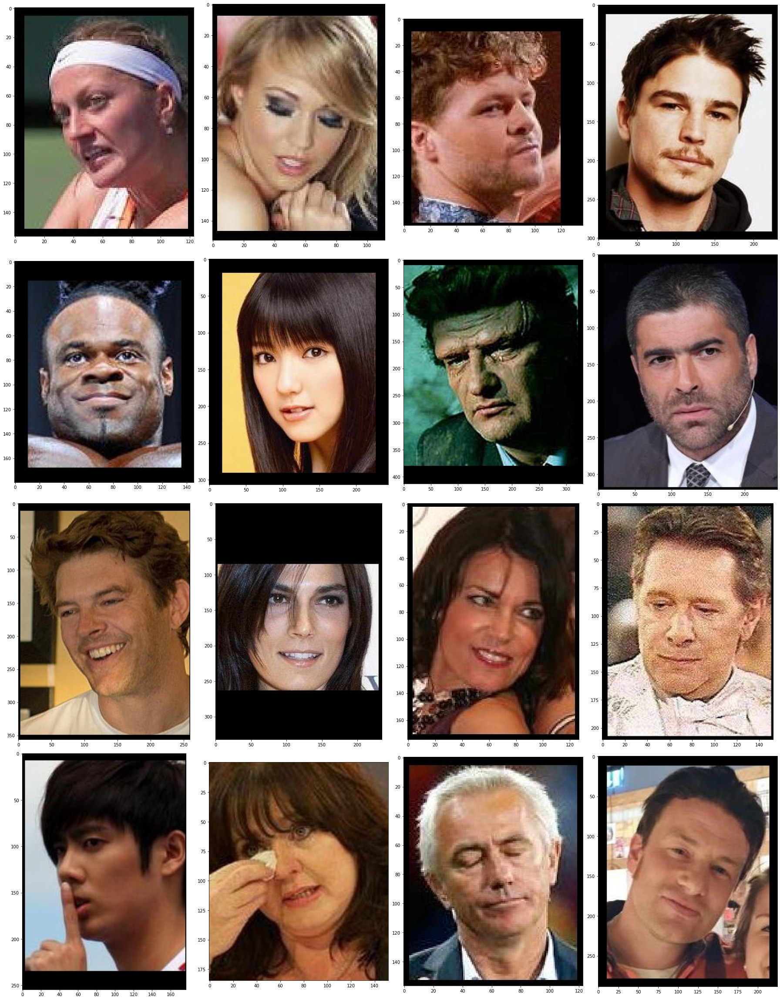

In [9]:
plot_train_data(is_draw_landmarks=False)

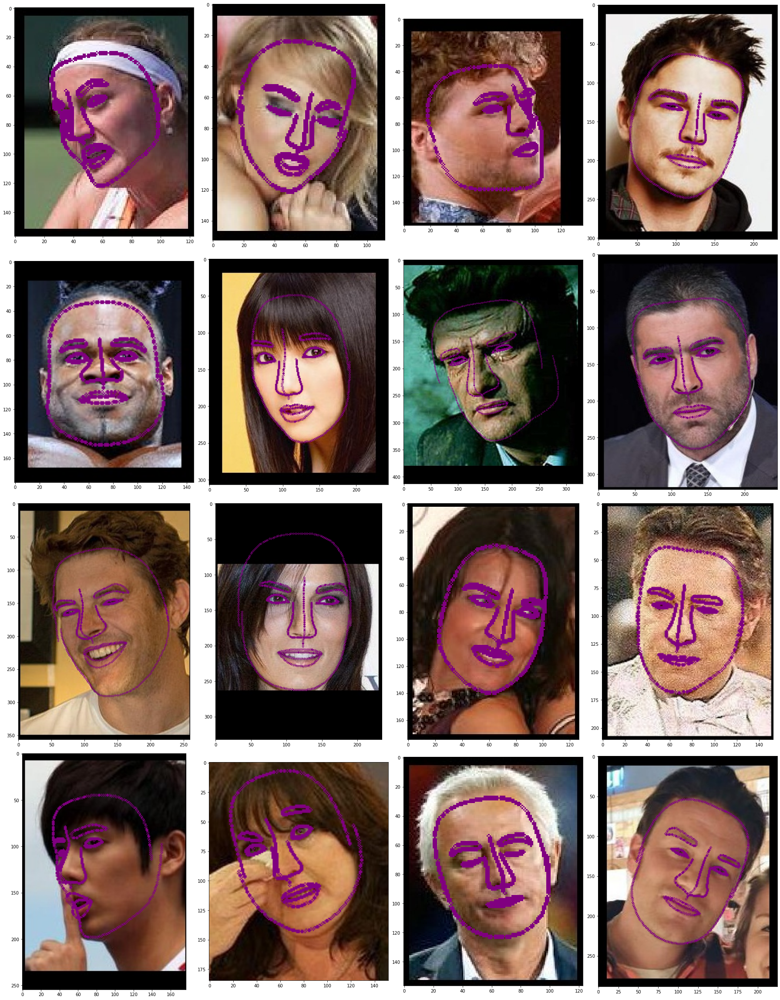

In [10]:
plot_train_data()

# Test predictions

In [13]:
pred_pickle_name = "resnet101_batch_64_test_predictions.pkl"

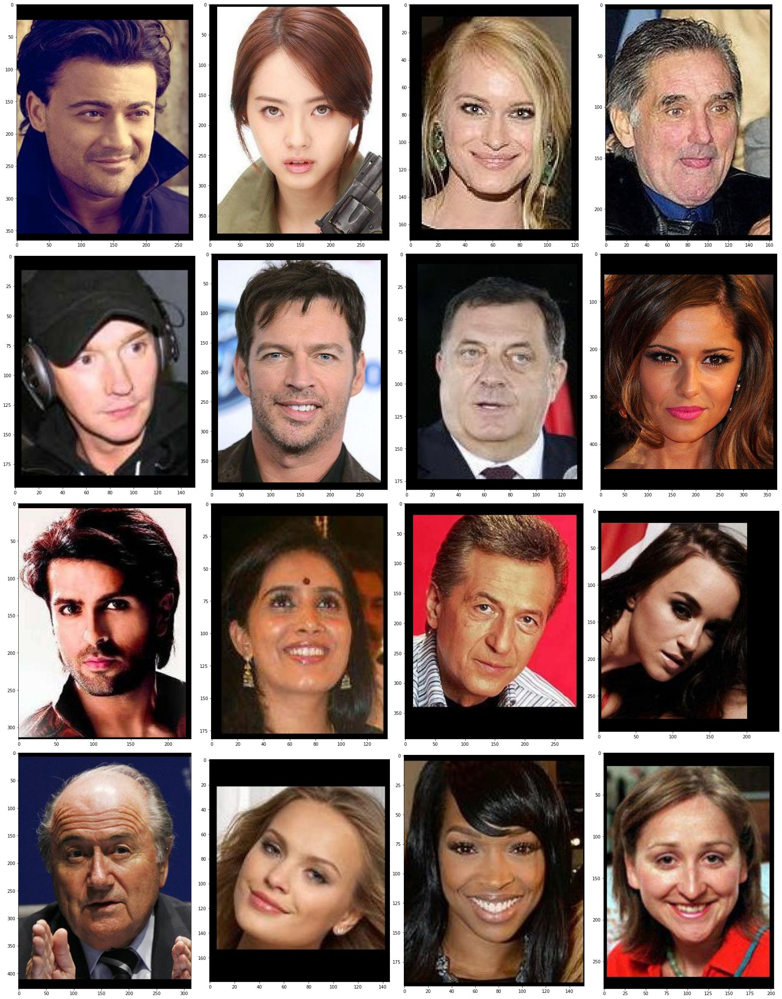

In [14]:
plot_test_predictions(pred_pickle_name, is_draw_landmarks=False)

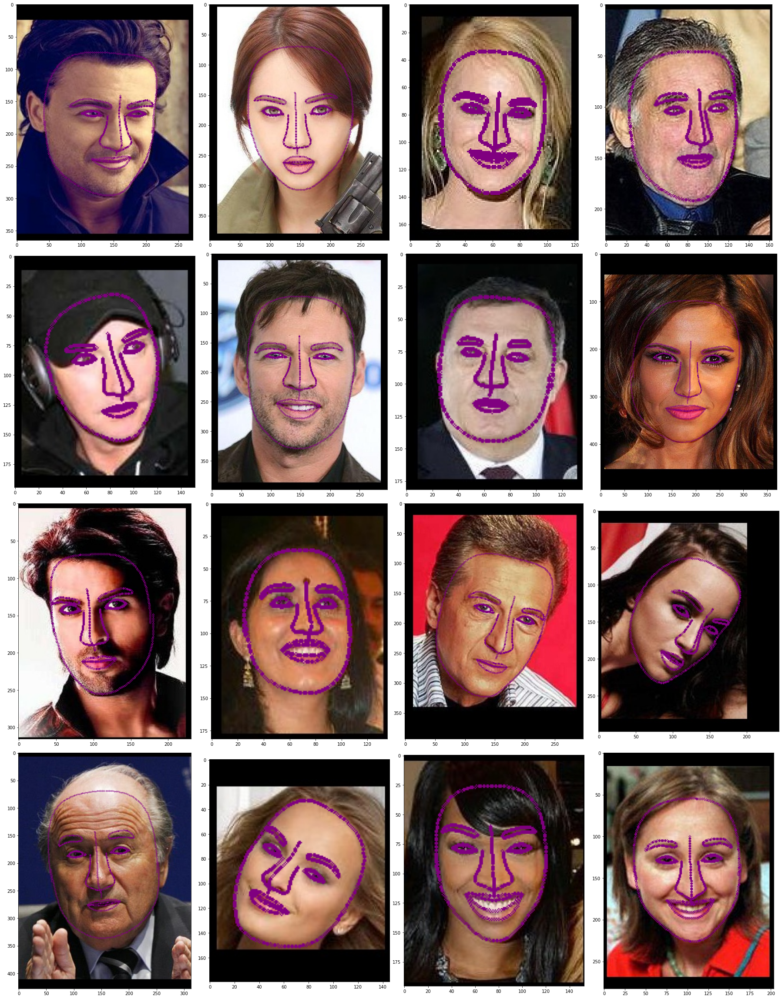

In [15]:
plot_test_predictions(pred_pickle_name)